In [13]:
#extract bpm from audio
import librosa 

song_id = "2cfba915-9d1d-41dc-92bb-729118ef6694"
base_path = "../samples/suno_samples"
audio_path = f"{base_path}/audio/{song_id}.mp3"

def get_bpm_from_audio(path):
    y, sr = librosa.load(path)
    tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
    return tempo
bpm = get_bpm_from_audio(audio_path)
print(f"BPM: {bpm}") 

BPM: 83.35433467741936


In [14]:
from chordAnalyzer import *
# Load and combine notes as you already do
midi_base_path = f"{base_path}/segmented/{song_id}/midi"
bass_midi_path = f"{midi_base_path}/bass.mid"
harmony_midi_path = f"{midi_base_path}/harmony.mid"

bass_notes = load_midi_notes(bass_midi_path, source_name='bass')
harmony_notes = load_midi_notes(harmony_midi_path, source_name='harmony')
combined_notes = bass_notes + harmony_notes
combined_notes.sort(key=lambda x: x['start'])

# Extract ALL chords and display timeline - just one line
#extract_all_chords_automatically(combined_notes)

aligned_notes = align_midi_to_audio(combined_notes, ms_shift=20)
bass_notes = align_midi_to_audio(bass_notes, ms_shift=20)

chords = extract_all_chords_with_defined_length(aligned_notes, bpm, window_size_beats=1, verbose=False, plot=False)
print(chords)



Loading MIDI file: ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/bass.mid
Extracted 612 notes from ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/bass.mid
Loading MIDI file: ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/harmony.mid
Extracted 2378 notes from ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/harmony.mid
Extracted 336 chords across 86 bars (0 from bass, 0 from harmony only)


Audio duration: 171.88 seconds (2.86 minutes)


/workspace/src/chordAnalyzer.py:2606: FutureWarning: get_duration() keyword argument 'filename' has been renamed to 'path' in version 0.10.0.
	This alias will be removed in version 1.0.
  audio_info = librosa.get_duration(filename=audio_path)


## Segment 1: 0-20 seconds

Bass notes in segment: 33
Loading audio: ../samples/suno_samples/audio/2cfba915-9d1d-41dc-92bb-729118ef6694.mp3
✓ Audio loaded: 20.00 seconds @ 22050Hz
Could not extract bass frequencies: module 'librosa.effects' has no attribute 'low_pass'


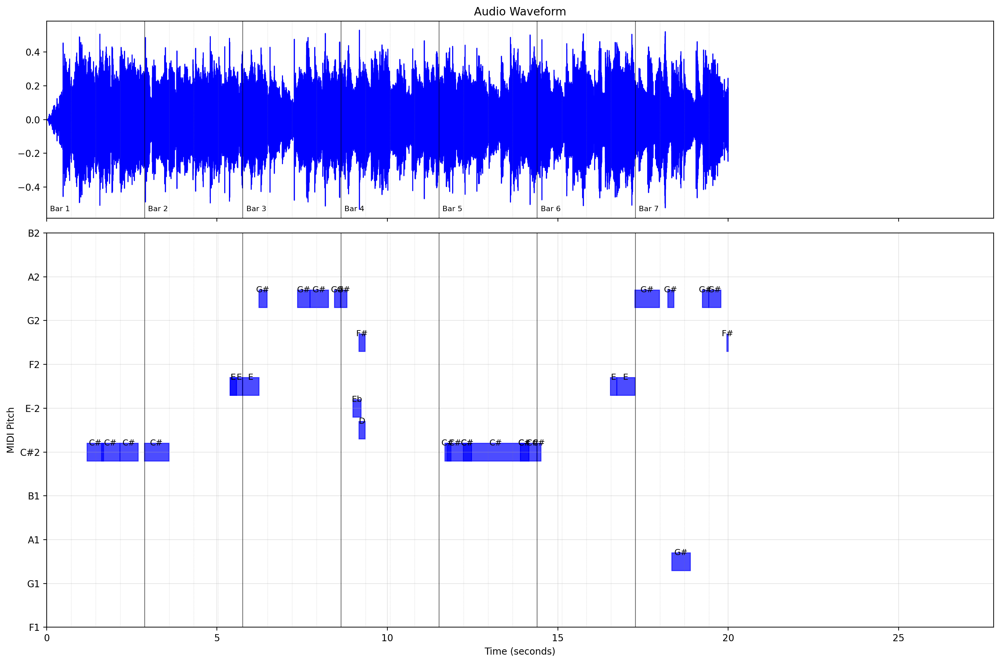

Audio segment (0-20 seconds):



--------------------------------------------------------------------------------



## Segment 2: 75-95 seconds

Bass notes in segment: 46
Loading audio: ../samples/suno_samples/audio/2cfba915-9d1d-41dc-92bb-729118ef6694.mp3
✓ Audio loaded: 20.00 seconds @ 22050Hz
Could not extract bass frequencies: module 'librosa.effects' has no attribute 'low_pass'


/workspace/src/chordAnalyzer.py:2576: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


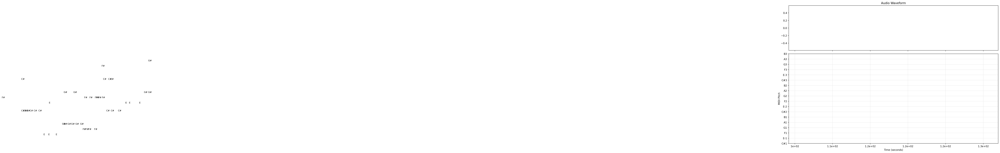

Audio segment (75-95 seconds):



--------------------------------------------------------------------------------



## Segment 3: 151-171 seconds

Bass notes in segment: 54
Loading audio: ../samples/suno_samples/audio/2cfba915-9d1d-41dc-92bb-729118ef6694.mp3
✓ Audio loaded: 20.00 seconds @ 22050Hz
Could not extract bass frequencies: module 'librosa.effects' has no attribute 'low_pass'


/workspace/src/chordAnalyzer.py:2576: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


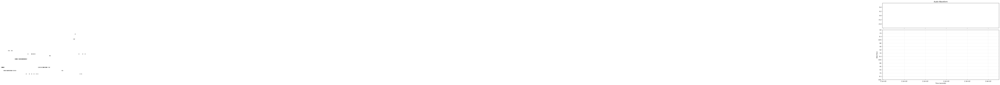

Audio segment (151-171 seconds):



--------------------------------------------------------------------------------



In [15]:
from chordAnalyzer import analyze_audio_bass_alignment
analyze = analyze_audio_bass_alignment(audio_path, bass_notes, bpm=bpm, segments=3, segment_duration=20)

BPM: 83.35433467741936


## Song Audio

✓ File exists: ../samples/suno_samples/audio/2cfba915-9d1d-41dc-92bb-729118ef6694.mp3
✓ File size: 3.94 MB


## MIDI Analysis

Loading MIDI files...
Loading MIDI file: ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/bass.mid
Extracted 612 notes from ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/bass.mid
Loading MIDI file: ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/harmony.mid
Extracted 2378 notes from ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/harmony.mid
Bass line has 278 moments with multiple simultaneous notes


## Bass Line Cleaning

Original bass notes: 612
Cleaned bass notes: 154
Removed 458 parallel bass notes
Original total duration: 325.25 beats
Cleaned total duration: 260.00 beats
Original time span: 1.67 to 341.50
Cleaned time span: 1.67 to 341.50


## Comparing Bass Lines

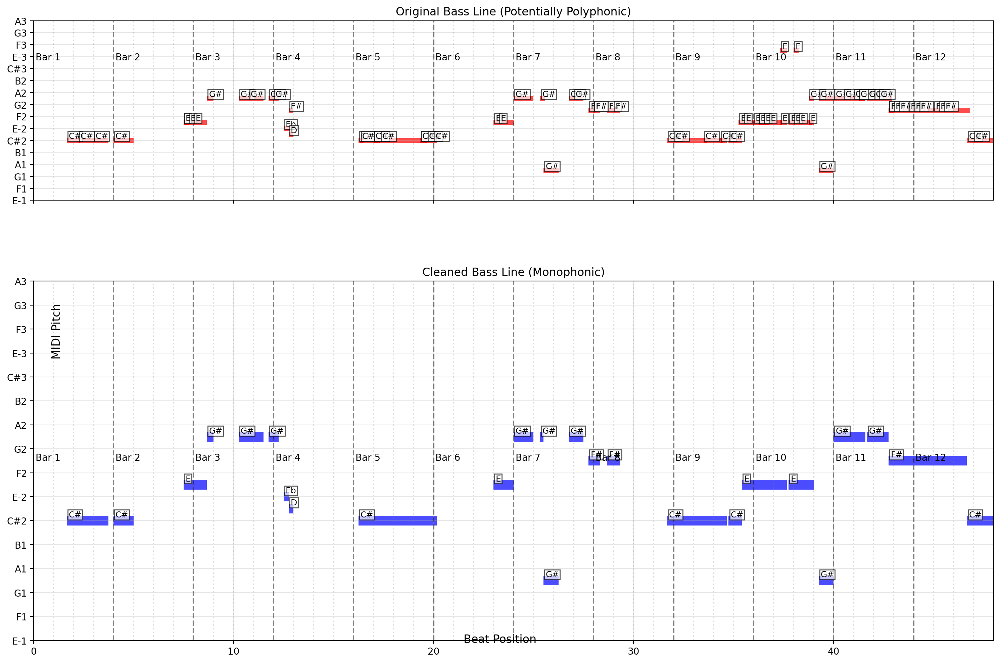

Original bass notes in selected bars: 80
Cleaned bass notes in selected bars: 25
Polyphonic moments in these bars: 26


## Visualizing First 4 Bars with All Notes


After cleaning:


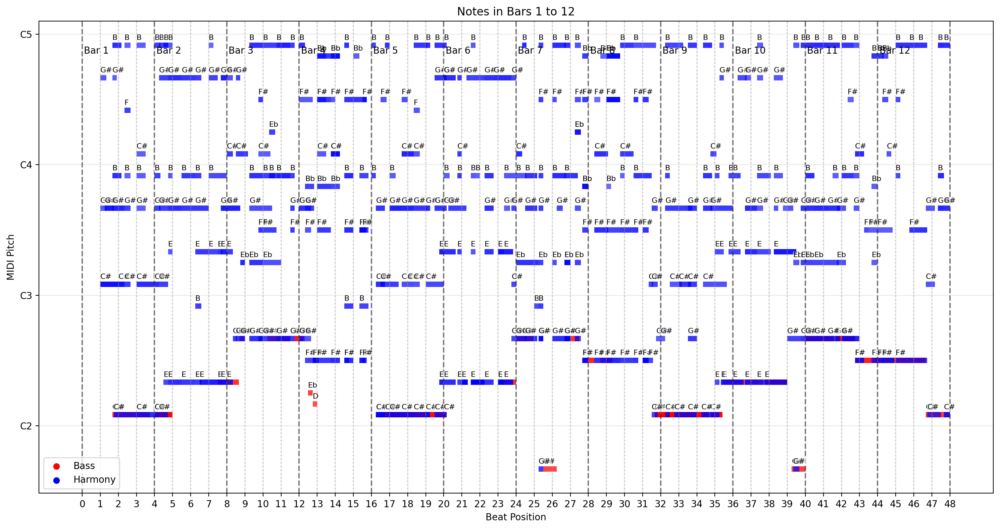

## Chord Analysis

Analyzing chords...


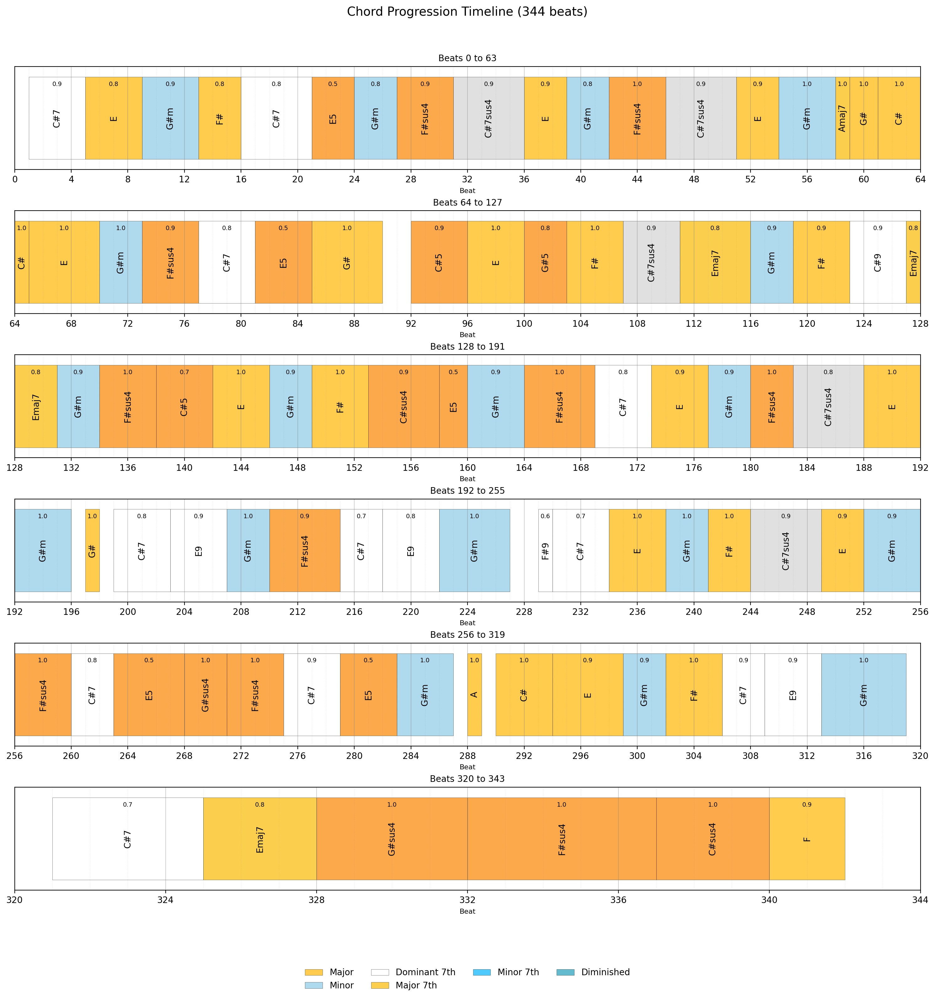

Visualization saved as: chord_progression.pdf


## Analysis Summary

Total chords extracted: 89

First 10 chords:
1. beats 1.0-5.0: C#7 (confidence: 0.90)
2. beats 5.0-9.0: E (confidence: 0.78)
3. beats 9.0-13.0: G#m (confidence: 0.93)
4. beats 13.0-16.0: F# (confidence: 0.80)
5. beats 16.0-21.0: C#7 (confidence: 0.83)
6. beats 21.0-24.0: E5 (confidence: 0.54)
7. beats 24.0-27.0: G#m (confidence: 0.82)
8. beats 27.0-31.0: F#sus4 (confidence: 0.89)
9. beats 31.0-36.0: C#7sus4 (confidence: 0.90)
10. beats 36.0-39.0: E (confidence: 0.90)


In [10]:
from chordAnalyzer import *
from IPython.display import display, Markdown, Audio

# 1. Setup paths
base_path = "../samples/suno_samples"
audio_path = f"{base_path}/audio/{song_id}.mp3"
midi_base_path = f"{base_path}/segmented/{song_id}/midi"
bass_midi_path = f"{midi_base_path}/bass.mid"
harmony_midi_path = f"{midi_base_path}/harmony.mid"

bpm = get_bpm_from_audio(audio_path)
print(  f"BPM: {bpm}")

# 2. Create an audio player to listen to the song
display(Markdown("## Song Audio"))
audio_player = play_audio_file(song_id, base_path=f"{base_path}/audio")
if audio_player:
    display(audio_player)

# 3. Load and analyze MIDI data
display(Markdown("## MIDI Analysis"))
print("Loading MIDI files...")
raw_bass_notes = load_midi_notes(bass_midi_path, source_name='bass')
harmony_notes = load_midi_notes(harmony_midi_path, source_name='harmony')

# 4. Analyze raw bass notes to check if cleaning is needed
polyphonic_moments = 0
current_time = 0
active_notes = []

for event in sorted(
    [(n['start'], 'start', n) for n in raw_bass_notes] + 
    [(n['end'], 'end', n) for n in raw_bass_notes], 
    key=lambda x: (x[0], 0 if x[1] == 'end' else 1)
):
    time, event_type, note = event
    if event_type == 'start':
        active_notes.append(note)
        if len(active_notes) > 1:
            polyphonic_moments += 1
    else:  # event_type == 'end'
        if note in active_notes:
            active_notes.remove(note)

print(f"Bass line has {polyphonic_moments} moments with multiple simultaneous notes")

# 5. Clean the bass line
display(Markdown("## Bass Line Cleaning"))
bass_notes = clean_bass_line(raw_bass_notes)

# # 6. Compare original and cleaned bass lines
display(Markdown("## Comparing Bass Lines"))
compare_bass_lines(raw_bass_notes, bass_notes, num_bars=12, start_bar=0)

# 7. Visualize the first few bars with all notes
display(Markdown("## Visualizing First 4 Bars with All Notes"))
# print("Before cleaning:")
# visualize_notes_in_bars(raw_bass_notes + harmony_notes, num_bars=4, start_bar=0)
print("\nAfter cleaning:")
visualize_notes_in_bars(bass_notes + harmony_notes, num_bars=12, start_bar=0)

# 8. Combine cleaned bass with harmony
combined_notes = bass_notes + harmony_notes
combined_notes.sort(key=lambda x: x['start'])

# 9. Extract chords using the cleaned monophonic bass line
display(Markdown("## Chord Analysis"))
print("Analyzing chords...")
chords = extract_all_chords_with_defined_length(combined_notes, bpm, window_size_beats=1, merge=True, verbose=True)

# 10. Summary
display(Markdown("## Analysis Summary"))
print(f"Total chords extracted: {len(chords)}")
print("\nFirst 10 chords:")
for i, chord in enumerate(chords[:10]):
    print(f"{i+1}. beats {chord['beat_start']:.1f}-{chord['beat_end']:.1f}: {chord['chord_name']} (confidence: {chord.get('confidence', 0):.2f})")

Loading MIDI file: ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/bass.mid
Extracted 612 notes from ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/bass.mid
Loading MIDI file: ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/harmony.mid
Extracted 2378 notes from ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/harmony.mid


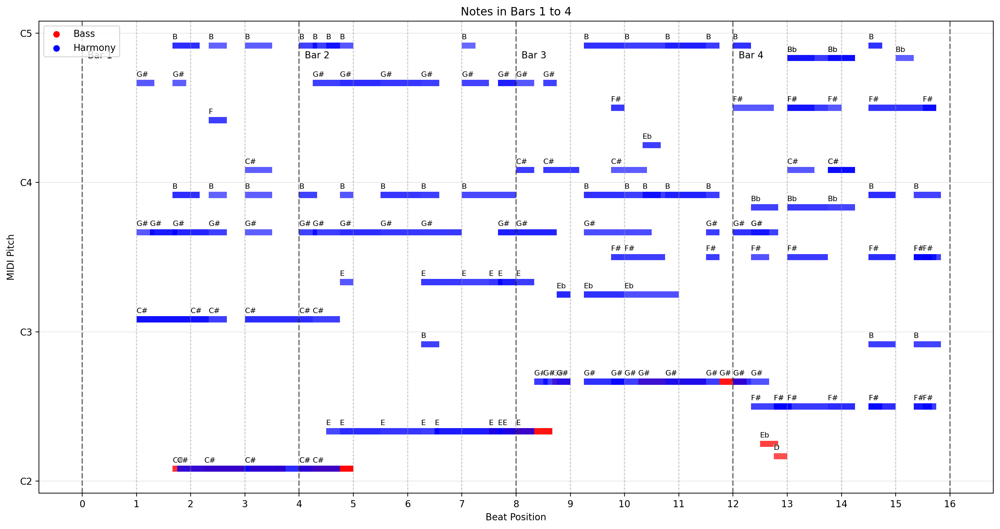


=== Analyzing Bar 1 with Time Windows ===

Bass notes in bar 1:
  Total bass notes: 3
  Significant bass notes (duration >= 0.5): 3
  Bass 1: C# (PC 1): 1.67-2.33, duration: 0.67
  Bass 2: C# (PC 1): 2.25-3.00, duration: 0.75
  Bass 3: C# (PC 1): 3.00-3.75, duration: 0.75


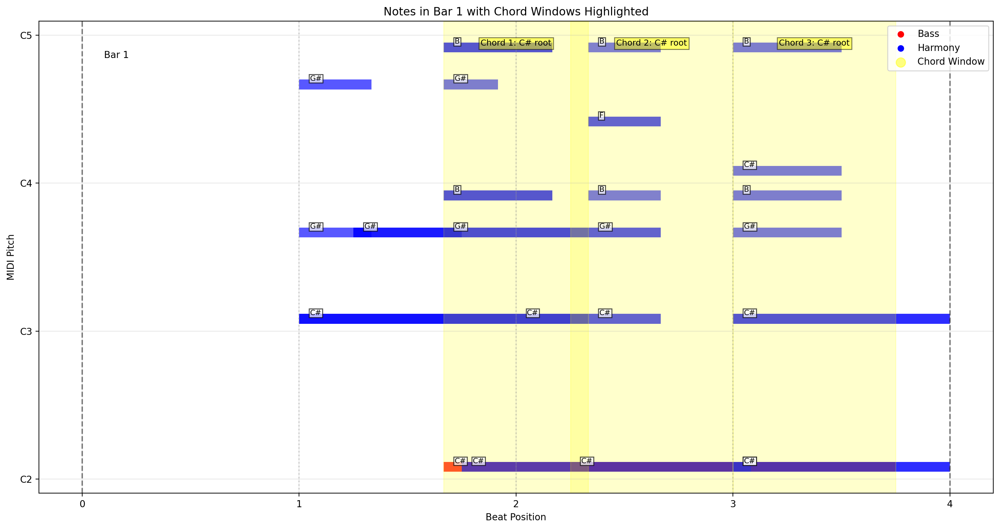

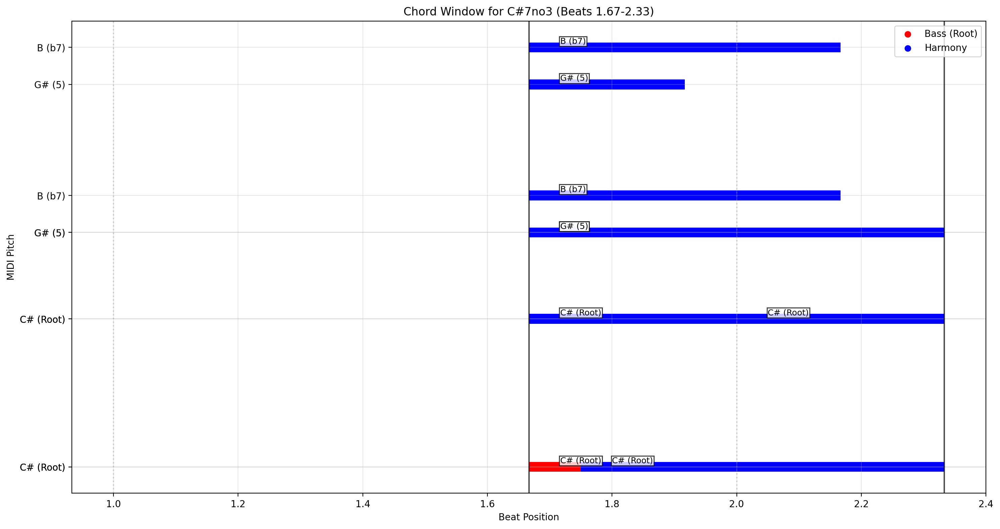


Bass note window 1: C# (1.67-2.33)
  Active harmony notes: ['C#', 'G#', 'B', 'B', 'G#', 'G#', 'C#', 'C#']
  Significant intervals: [0, 7, 10]
  Identified chord: C#7no3


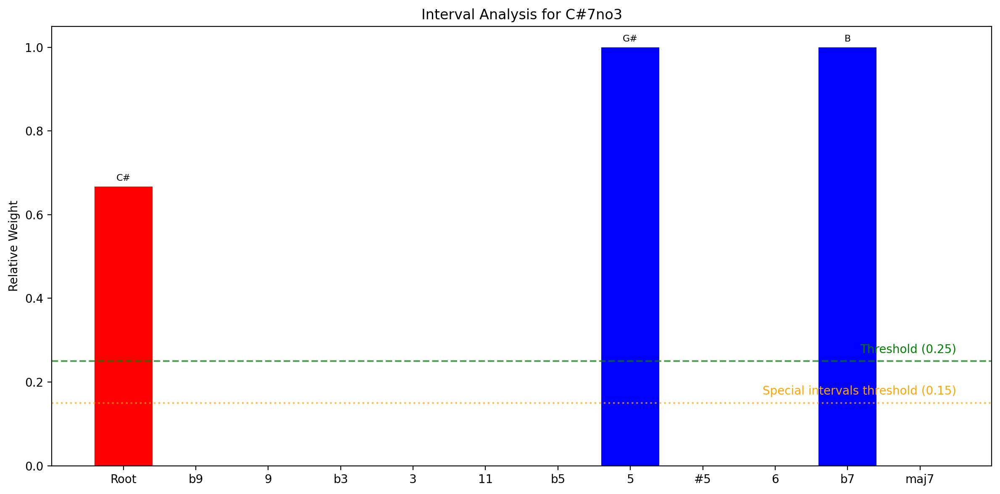


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
10       b7     1.000      1.000      B
7        5      1.000      1.000      G#
0        Root   0.667      0.667      C#


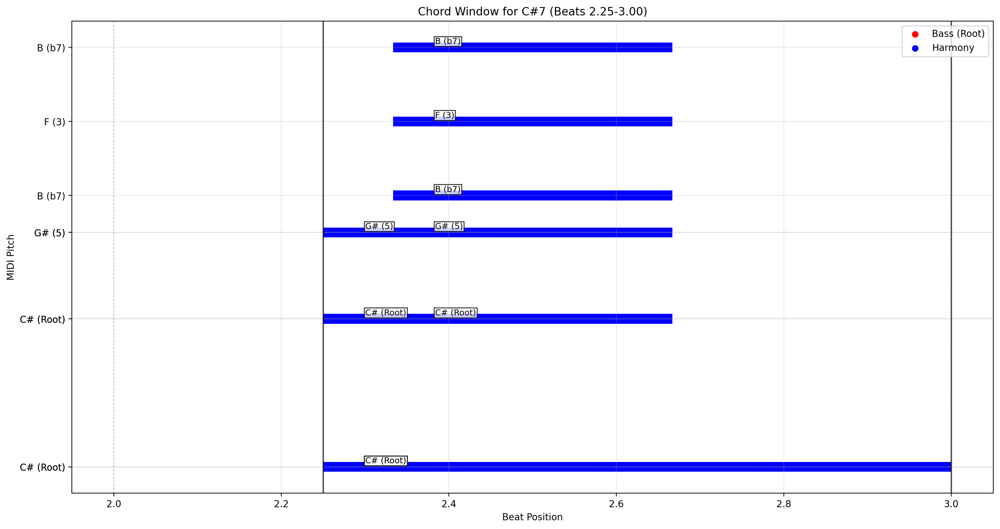


Bass note window 2: C# (2.25-3.00)
  Active harmony notes: ['G#', 'C#', 'C#', 'C#', 'G#', 'F', 'B', 'B']
  Significant intervals: [0, 4, 7, 10]
  Identified chord: C#7


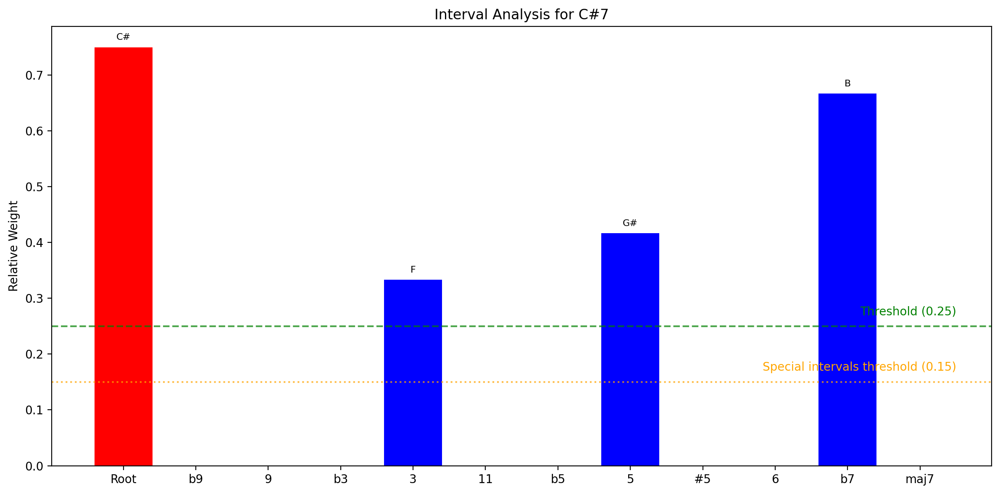


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
0        Root   0.750      0.750      C#
10       b7     0.667      0.667      B
7        5      0.417      0.417      G#
4        3      0.333      0.333      F


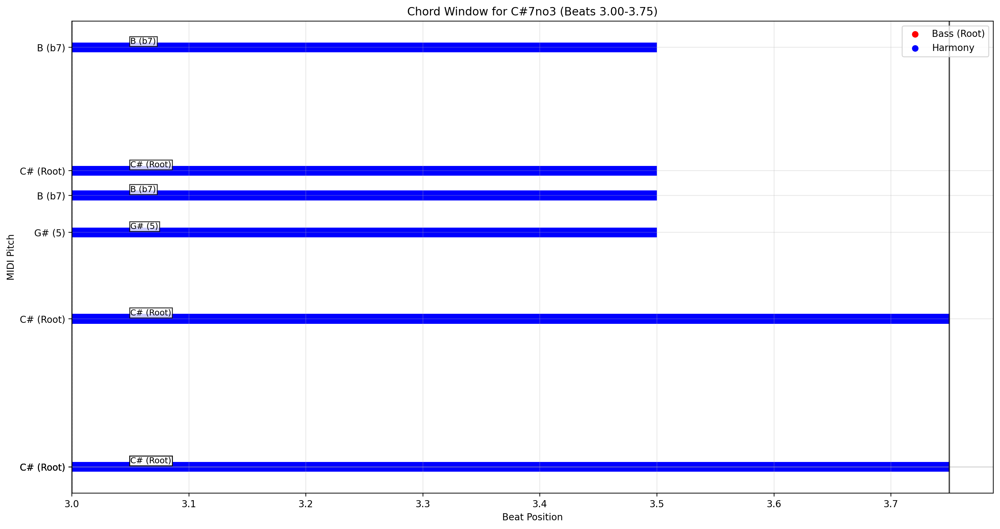


Bass note window 3: C# (3.00-3.75)
  Active harmony notes: ['C#', 'C#', 'C#', 'C#', 'G#', 'B', 'B']
  Significant intervals: [0, 7, 10]
  Identified chord: C#7no3


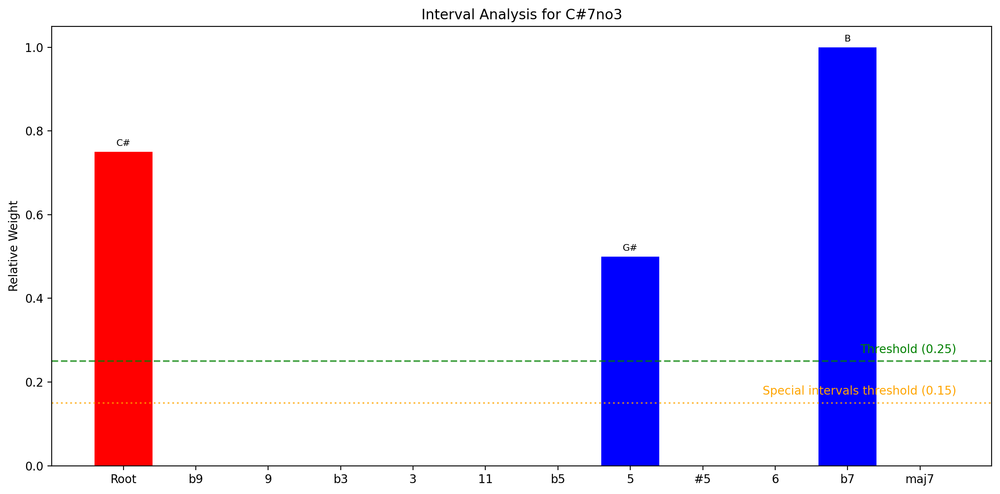


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
10       b7     1.000      1.000      B
0        Root   0.750      0.750      C#
7        5      0.500      0.500      G#

=== Analyzing Bar 2 with Time Windows ===

Bass notes in bar 2:
  Total bass notes: 4
  Significant bass notes (duration >= 0.5): 1
  Bass 1: C# (PC 1): 4.00-5.00, duration: 1.00


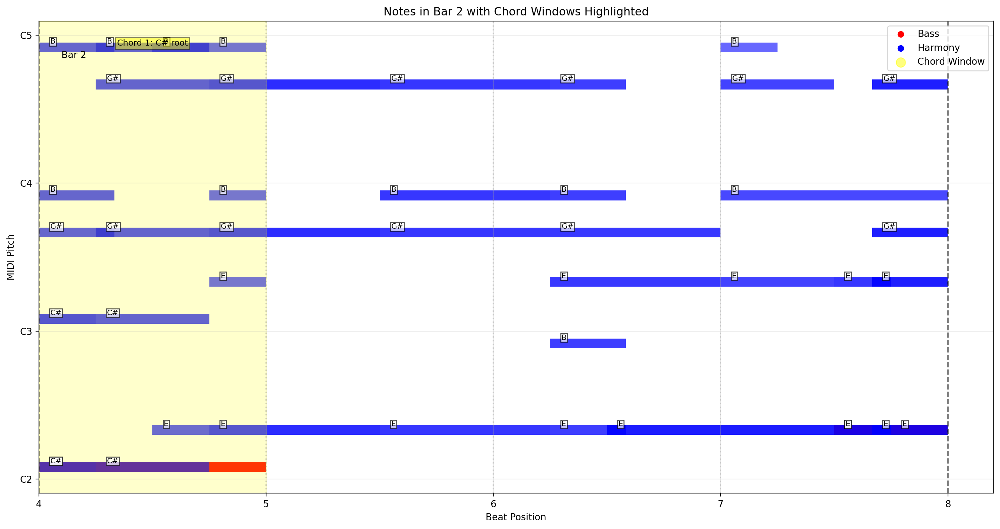

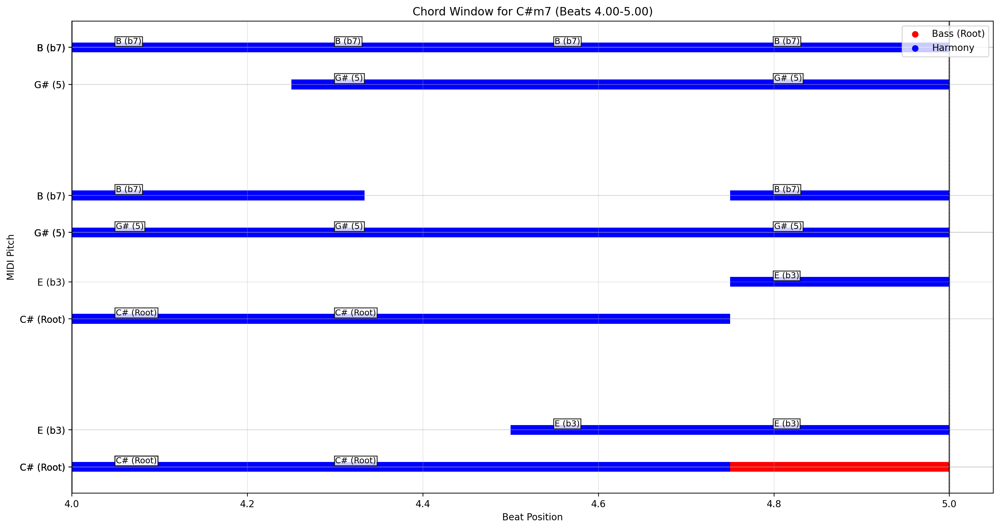


Bass note window 1: C# (4.00-5.00)
  Active harmony notes: ['G#', 'B', 'B', 'C#', 'C#', 'G#', 'B', 'C#', 'C#', 'G#', 'E', 'B', 'E', 'G#', 'G#', 'E', 'B', 'B']
  Significant intervals: [0, 3, 7, 10]
  Identified chord: C#m7


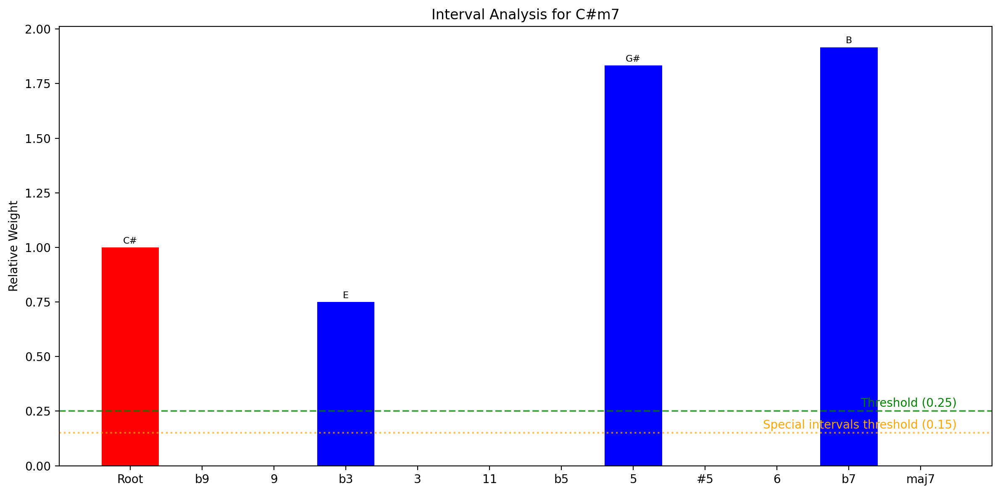


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
10       b7     1.917      1.917      B
7        5      1.833      1.833      G#
0        Root   1.000      1.000      C#
3        b3     0.750      0.750      E

=== Analyzing Bar 3 with Time Windows ===

Bass notes in bar 3:
  Total bass notes: 5
  Significant bass notes (duration >= 0.5): 3
  Bass 1: E (PC 4): 8.00-8.67, duration: 0.67
  Bass 2: G# (PC 8): 10.25-10.75, duration: 0.50
  Bass 3: G# (PC 8): 10.75-11.50, duration: 0.75


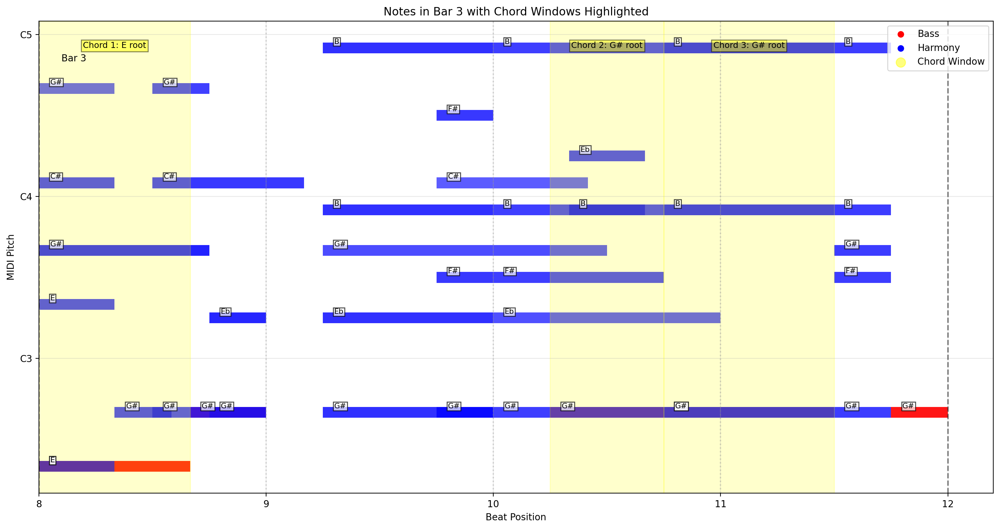

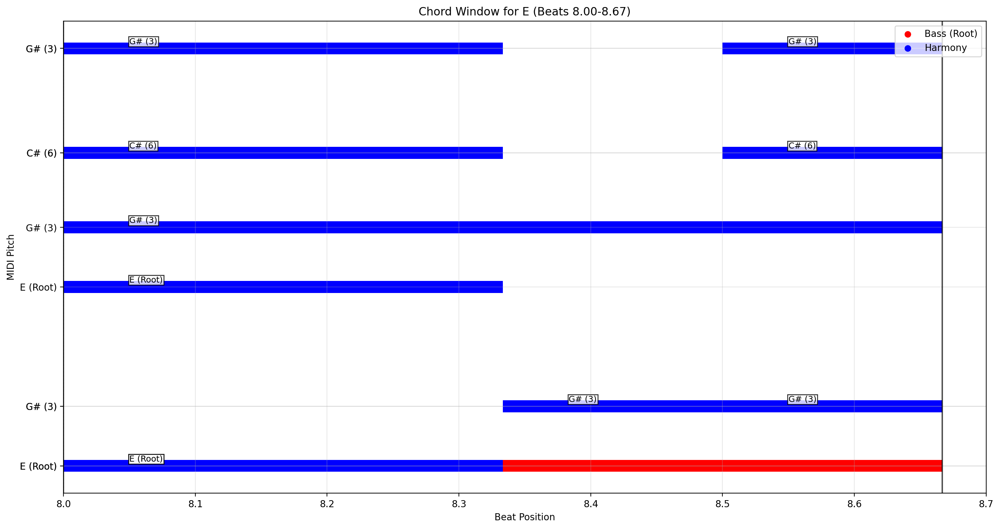


Bass note window 1: E (8.00-8.67)
  Active harmony notes: ['E', 'E', 'C#', 'G#', 'G#', 'G#', 'G#', 'G#', 'C#']
  Significant intervals: [0, 4, 9]
  Identified chord: E


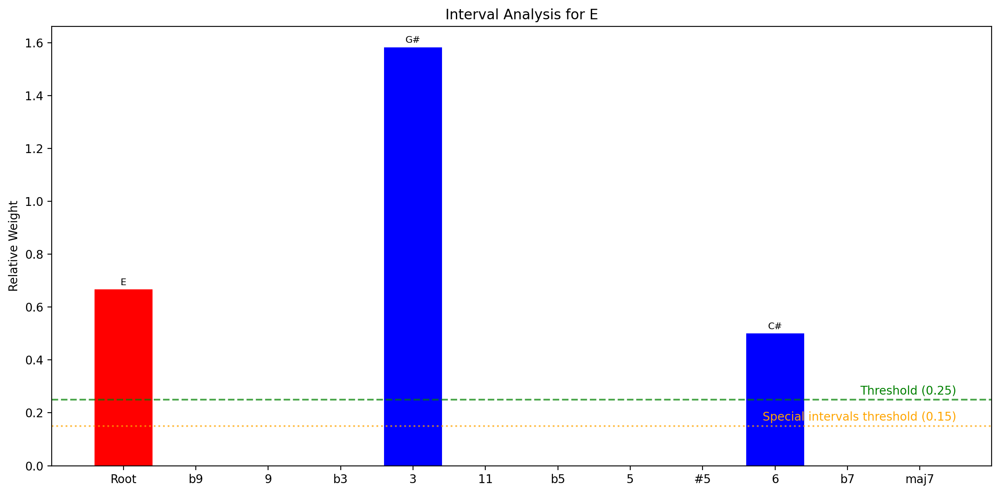


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
4        3      1.583      1.583      G#
0        Root   0.667      0.667      E
9        6      0.500      0.500      C#


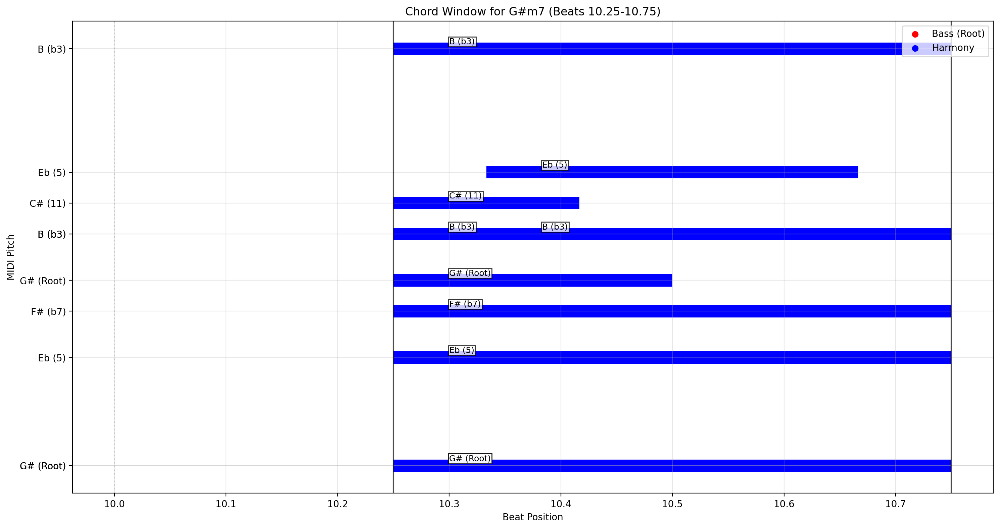


Bass note window 2: G# (10.25-10.75)
  Active harmony notes: ['G#', 'C#', 'Eb', 'F#', 'B', 'B', 'G#', 'Eb', 'B']
  Significant intervals: [0, 3, 7, 10]
  Identified chord: G#m7


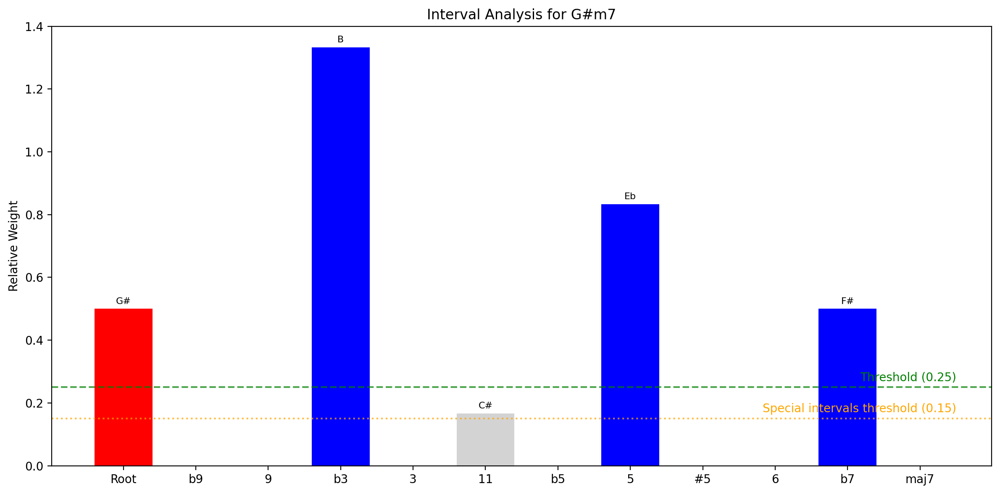


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
3        b3     1.333      1.333      B
7        5      0.833      0.833      Eb
0        Root   0.500      0.500      G#
10       b7     0.500      0.500      F#
5        11     0.167      0.167      C#


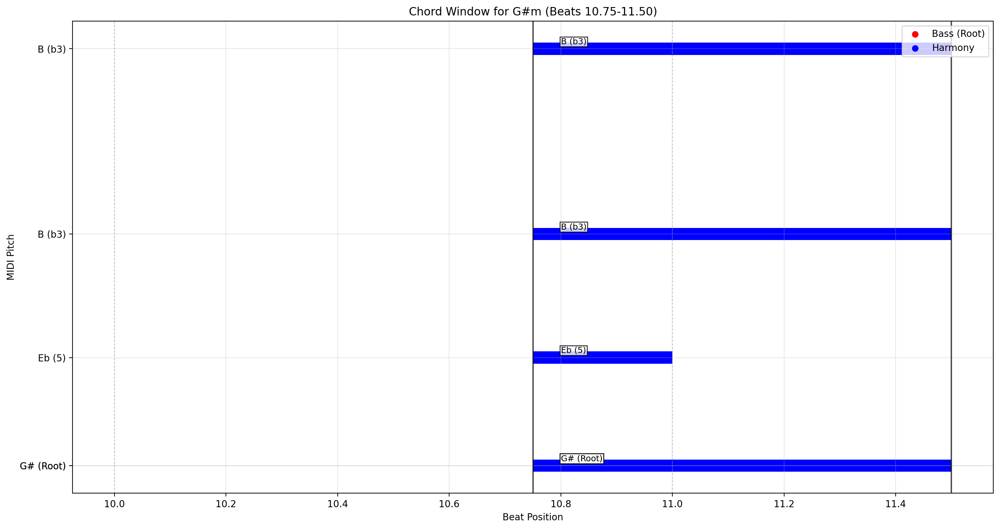


Bass note window 3: G# (10.75-11.50)
  Active harmony notes: ['Eb', 'B', 'B', 'G#']
  Significant intervals: [0, 3, 7]
  Identified chord: G#m


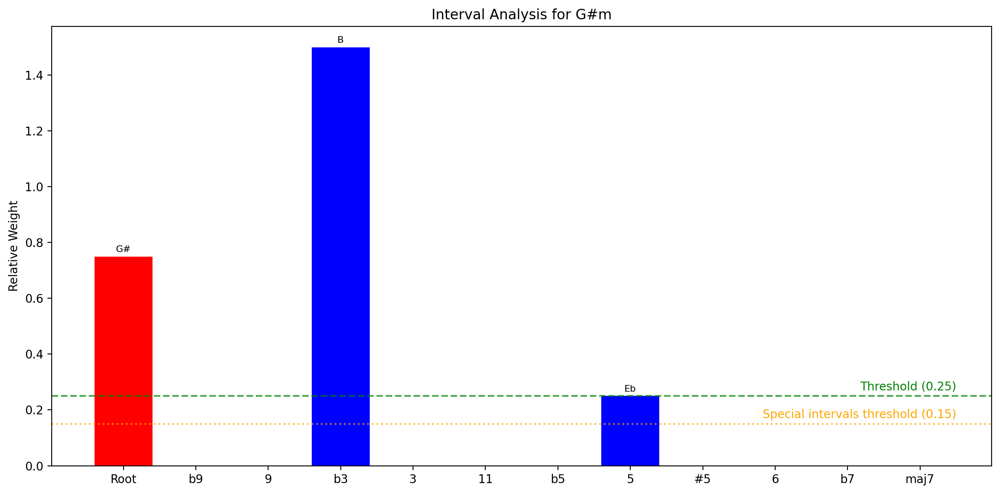


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
3        b3     1.500      1.500      B
0        Root   0.750      0.750      G#
7        5      0.250      0.250      Eb

=== Analyzing Bar 4 with Time Windows ===

Bass notes in bar 4:
  Total bass notes: 4
  Significant bass notes (duration >= 0.5): 1
  Bass 1: Eb (PC 3): 12.50-12.83, duration: 0.33


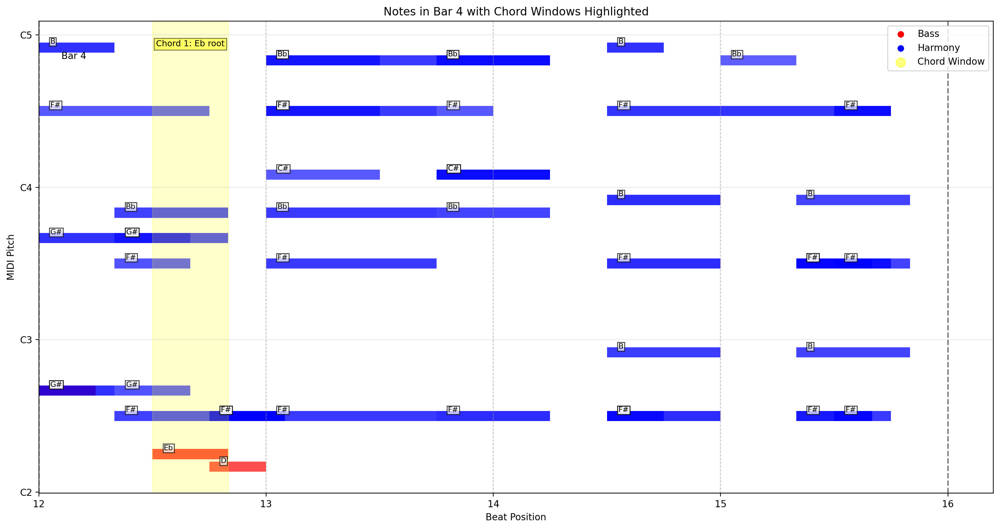

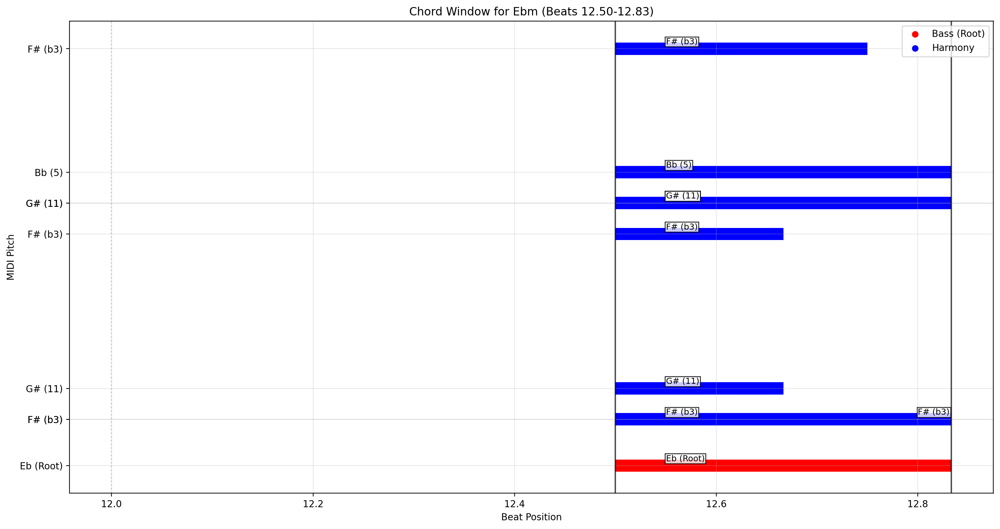


Bass note window 1: Eb (12.50-12.83)
  Active harmony notes: ['F#', 'F#', 'G#', 'G#', 'F#', 'G#', 'Bb', 'F#']
  Significant intervals: [0, 3, 5, 7]
  Identified chord: Ebm


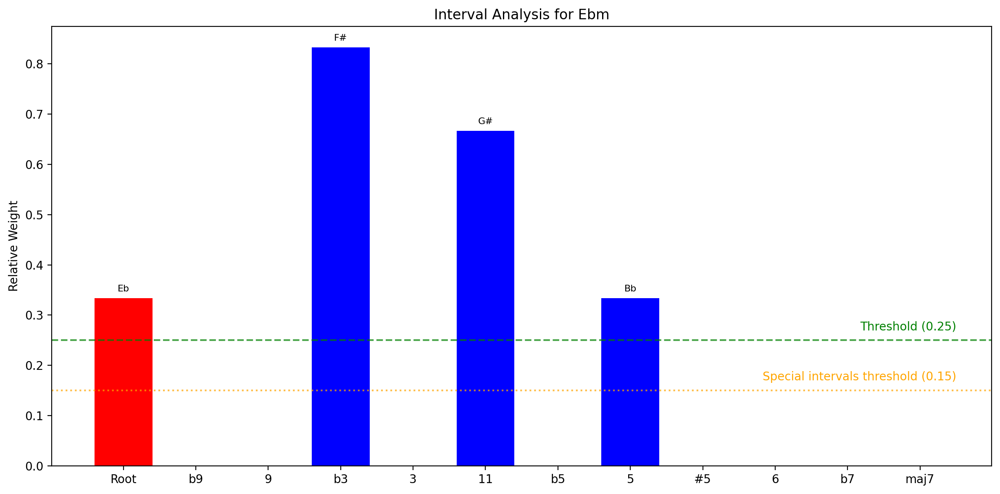


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
3        b3     0.833      0.833      F#
5        11     0.667      0.667      G#
0        Root   0.333      0.333      Eb
7        5      0.333      0.333      Bb

CHORD PROGRESSION SUMMARY (TIME-WINDOWED):
Bar    Chords
------------------------------------------------------------
1      C#7no3 → C#7 → C#7no3
2      C#m7
3      E → G#m7 → G#m
4      Ebm

=== Refined Chord Identification ===

Root: C#
Original Chord: C#7no3
Refined Chord: C#7
Normalized Interval Weights:
  b7: 0.375
  5: 0.375
  Root: 0.250

Root: C#
Original Chord: C#7
Refined Chord: C#7
Normalized Interval Weights:
  Root: 0.346
  b7: 0.308
  5: 0.192
  3: 0.154

Root: C#
Original Chord: C#7no3
Refined Chord: C#7
Normalized Interval Weights:
  b7: 0.444
  Root: 0.333
  5: 0.222

=== Refined Chord Identification ===

Root: C#
Original Chord: C#m7
Refined Chord: C#m7
Normalized Interval 

In [16]:
from chordAnalyzer import *
# First, load the MIDI files (assuming they exist)
bass_notes = load_midi_notes(bass_midi_path, source_name="bass")
harmony_notes = load_midi_notes(harmony_midi_path, source_name="harmony")

# Combine the notes from both sources
combined_notes = bass_notes + harmony_notes

# Now call the function to analyze the first 4 bars (starting from bar 0)
# This will show both the original analysis and the refined analysis
refined_results = analyze_progression_with_unique_chords(
    notes=combined_notes, 
    start_bar=0,  # Start from the first bar (index 0)
    num_bars=4,   # Analyze 4 bars
    beats_per_bar=4  # Assuming 4/4 time signature
)

Loading MIDI file: ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/bass.mid
Extracted 612 notes from ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/bass.mid
Loading MIDI file: ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/harmony.mid
Extracted 2378 notes from ../samples/suno_samples/segmented/2cfba915-9d1d-41dc-92bb-729118ef6694/midi/harmony.mid
Combined 612 bass notes and 2378 harmony notes


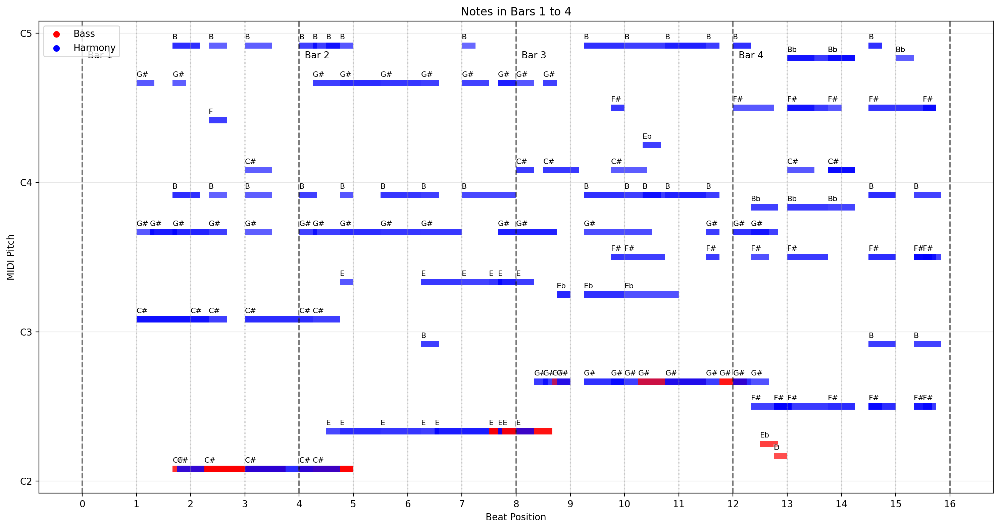


=== Analyzing Bar 1 with Time Windows ===

Bass notes in bar 1:
  Total bass notes: 3
  Significant bass notes (duration >= 0.5): 3
  Bass 1: C# (PC 1): 1.67-2.33, duration: 0.67
  Bass 2: C# (PC 1): 2.25-3.00, duration: 0.75
  Bass 3: C# (PC 1): 3.00-3.75, duration: 0.75


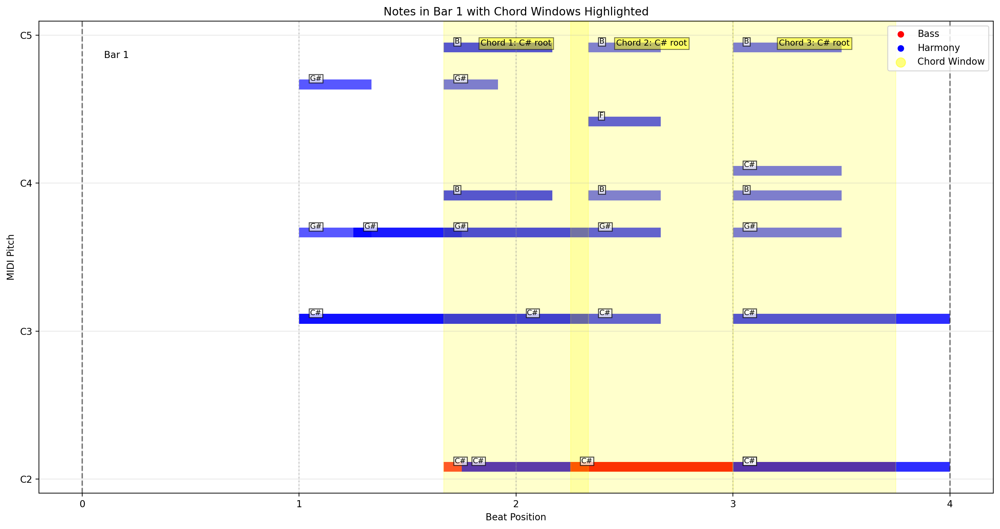

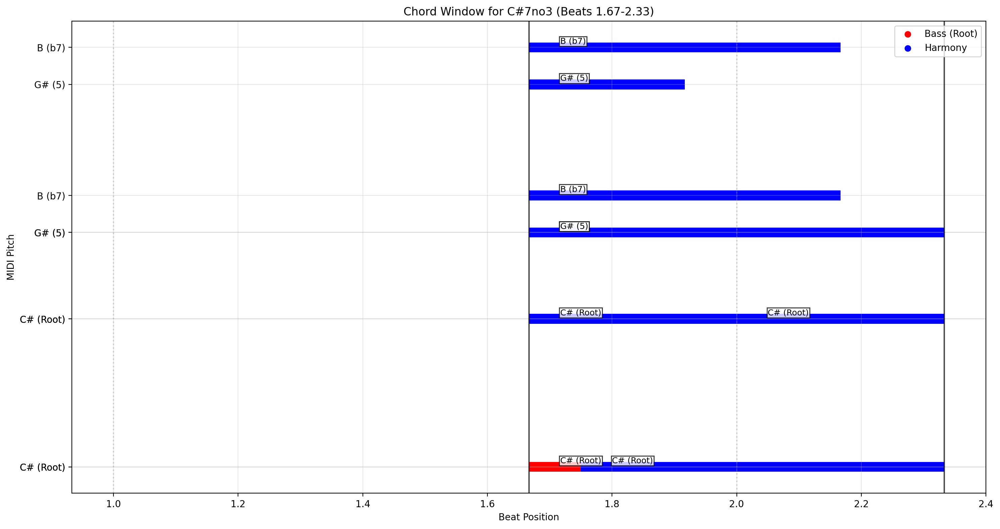


Bass note window 1: C# (1.67-2.33)
  Active harmony notes: ['C#', 'G#', 'B', 'B', 'G#', 'G#', 'C#', 'C#']
  Significant intervals: [0, 7, 10]
  Identified chord: C#7no3


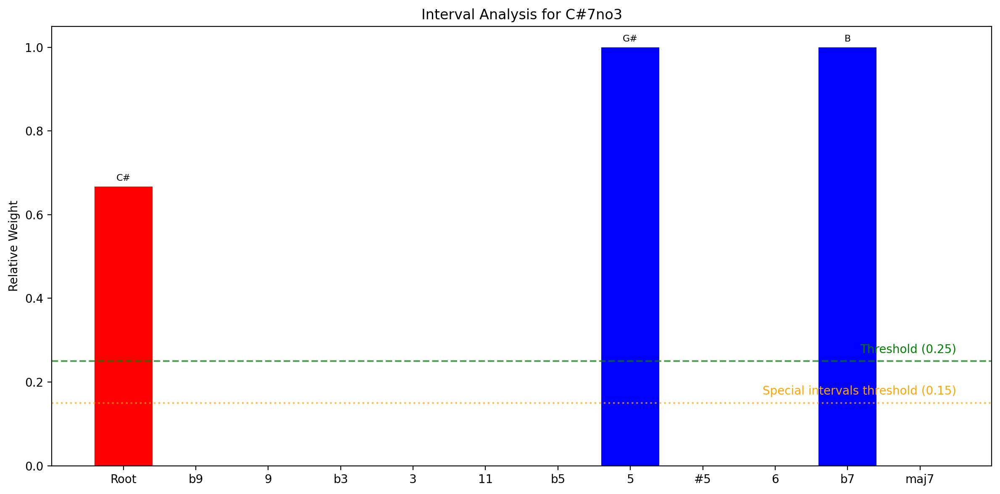


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
10       b7     1.000      1.000      B
7        5      1.000      1.000      G#
0        Root   0.667      0.667      C#


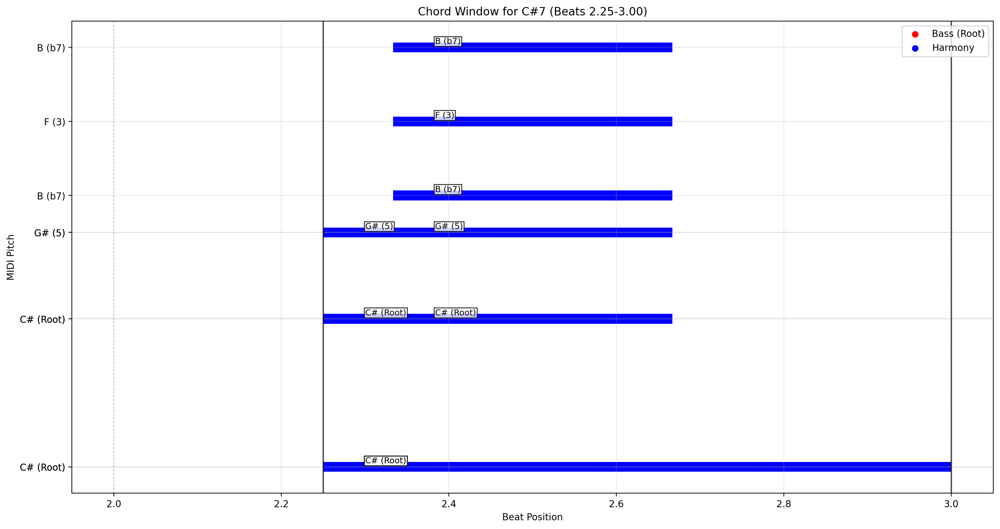


Bass note window 2: C# (2.25-3.00)
  Active harmony notes: ['G#', 'C#', 'C#', 'C#', 'G#', 'F', 'B', 'B']
  Significant intervals: [0, 4, 7, 10]
  Identified chord: C#7


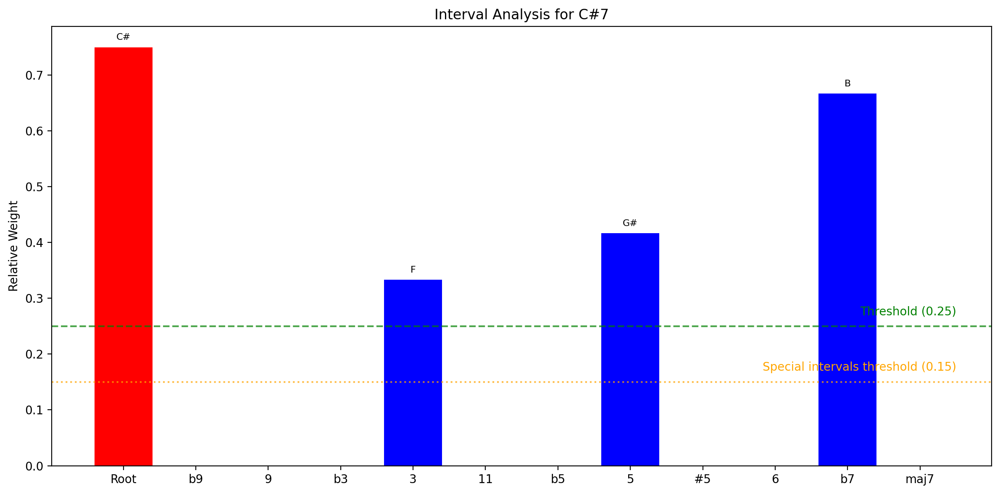


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
0        Root   0.750      0.750      C#
10       b7     0.667      0.667      B
7        5      0.417      0.417      G#
4        3      0.333      0.333      F


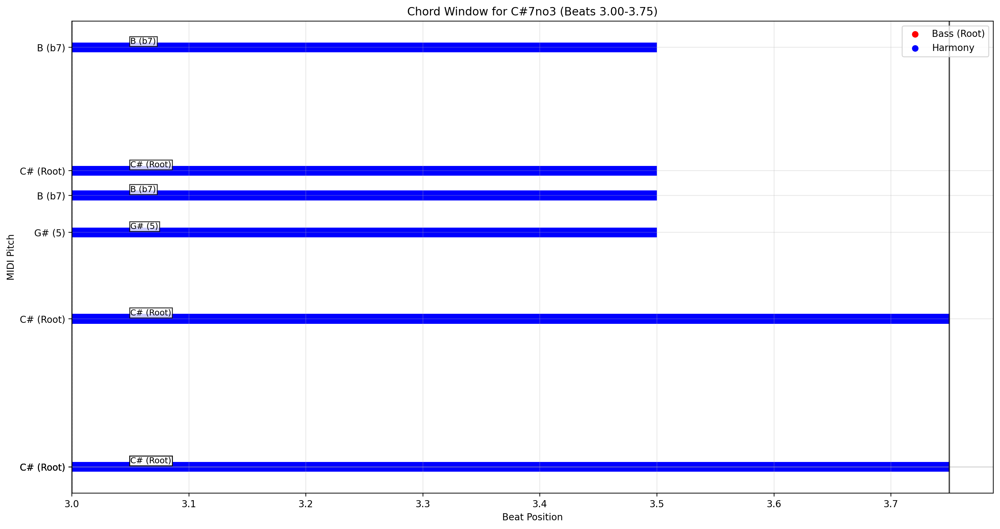


Bass note window 3: C# (3.00-3.75)
  Active harmony notes: ['C#', 'C#', 'C#', 'C#', 'G#', 'B', 'B']
  Significant intervals: [0, 7, 10]
  Identified chord: C#7no3


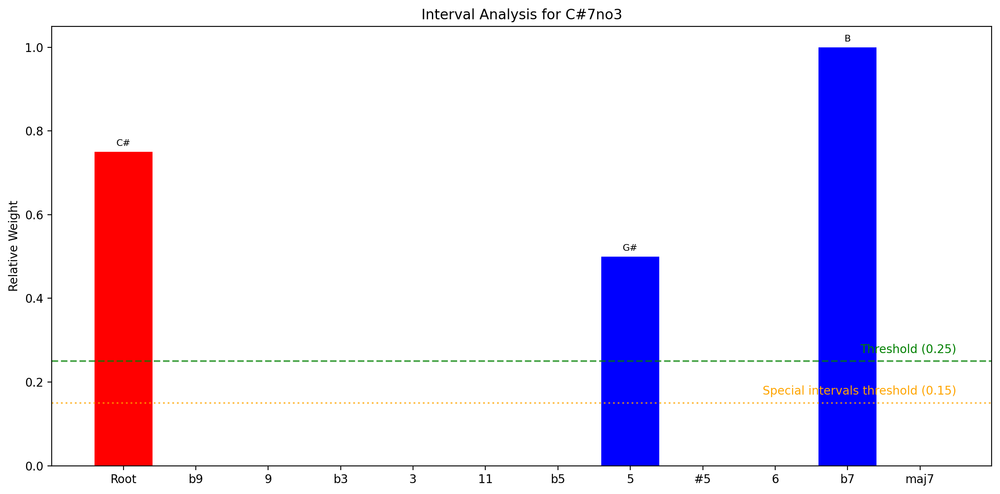


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
10       b7     1.000      1.000      B
0        Root   0.750      0.750      C#
7        5      0.500      0.500      G#

=== Analyzing Bar 2 with Time Windows ===

Bass notes in bar 2:
  Total bass notes: 4
  Significant bass notes (duration >= 0.5): 1
  Bass 1: C# (PC 1): 4.00-5.00, duration: 1.00


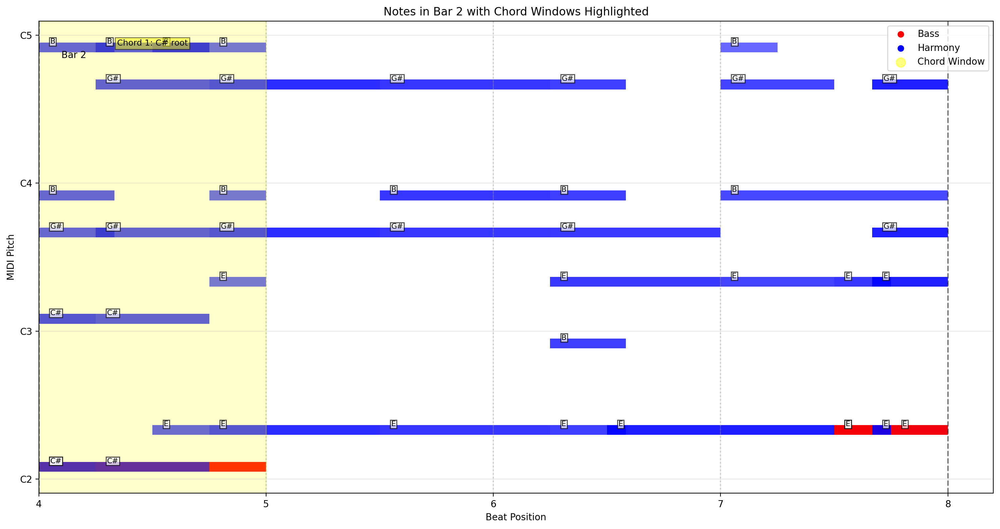

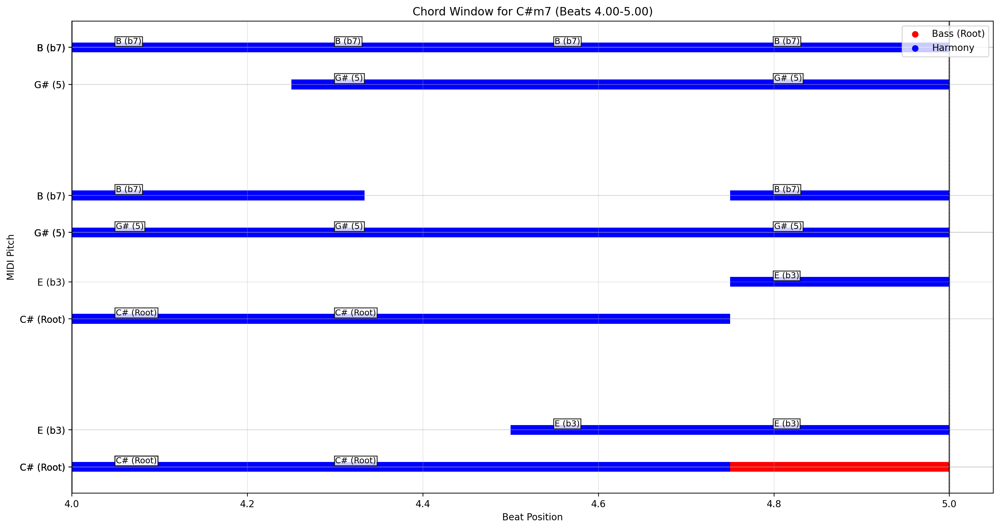


Bass note window 1: C# (4.00-5.00)
  Active harmony notes: ['G#', 'B', 'B', 'C#', 'C#', 'G#', 'B', 'C#', 'C#', 'G#', 'E', 'B', 'E', 'G#', 'G#', 'E', 'B', 'B']
  Significant intervals: [0, 3, 7, 10]
  Identified chord: C#m7


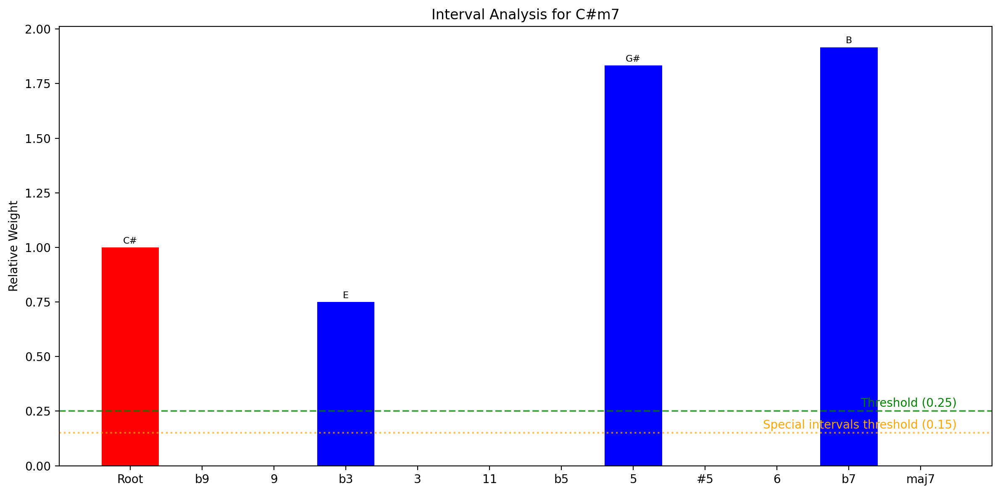


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
10       b7     1.917      1.917      B
7        5      1.833      1.833      G#
0        Root   1.000      1.000      C#
3        b3     0.750      0.750      E

=== Analyzing Bar 3 with Time Windows ===

Bass notes in bar 3:
  Total bass notes: 5
  Significant bass notes (duration >= 0.5): 3
  Bass 1: E (PC 4): 8.00-8.67, duration: 0.67
  Bass 2: G# (PC 8): 10.25-10.75, duration: 0.50
  Bass 3: G# (PC 8): 10.75-11.50, duration: 0.75


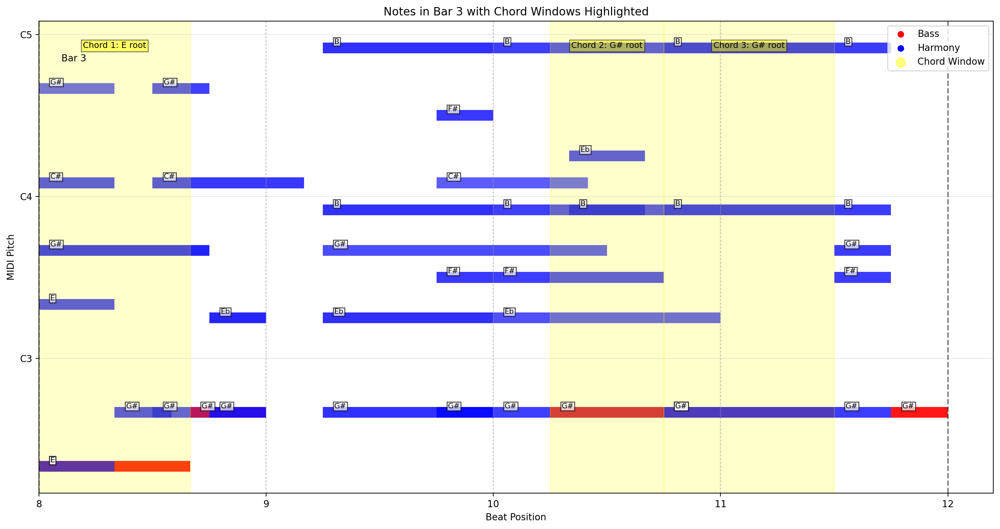

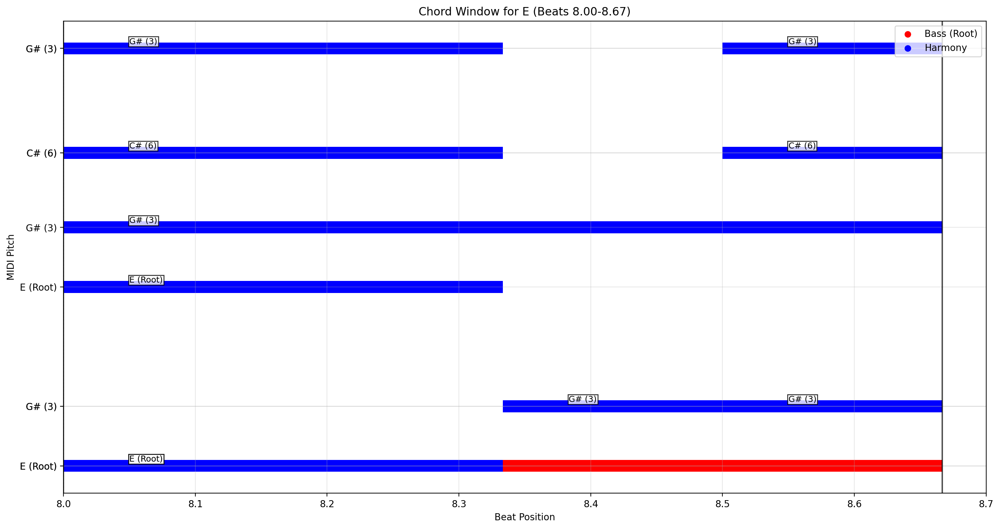


Bass note window 1: E (8.00-8.67)
  Active harmony notes: ['E', 'E', 'C#', 'G#', 'G#', 'G#', 'G#', 'G#', 'C#']
  Significant intervals: [0, 4, 9]
  Identified chord: E


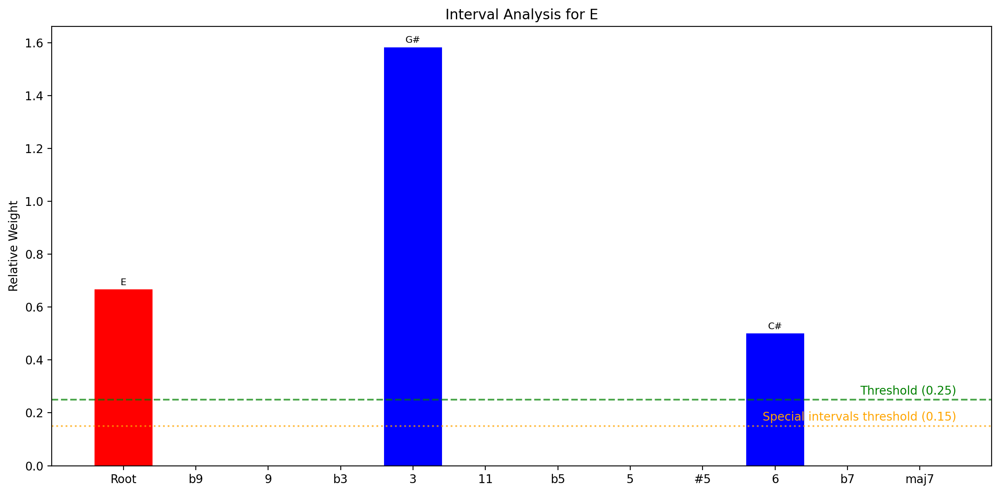


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
4        3      1.583      1.583      G#
0        Root   0.667      0.667      E
9        6      0.500      0.500      C#


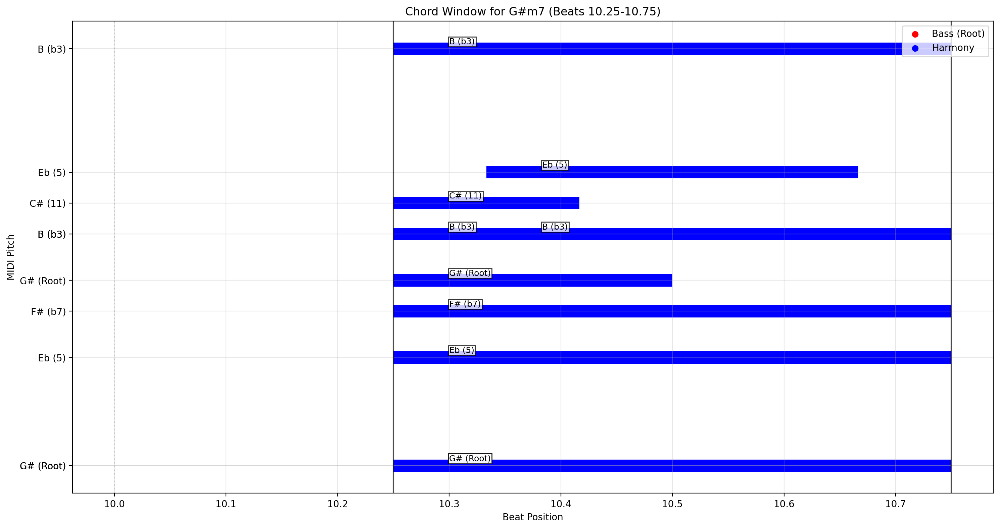


Bass note window 2: G# (10.25-10.75)
  Active harmony notes: ['G#', 'C#', 'Eb', 'F#', 'B', 'B', 'G#', 'Eb', 'B']
  Significant intervals: [0, 3, 7, 10]
  Identified chord: G#m7


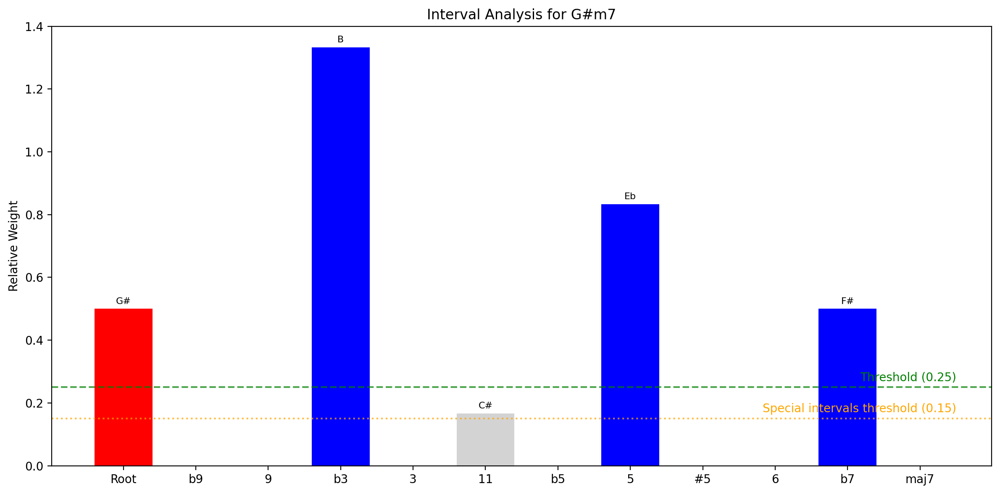


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
3        b3     1.333      1.333      B
7        5      0.833      0.833      Eb
0        Root   0.500      0.500      G#
10       b7     0.500      0.500      F#
5        11     0.167      0.167      C#


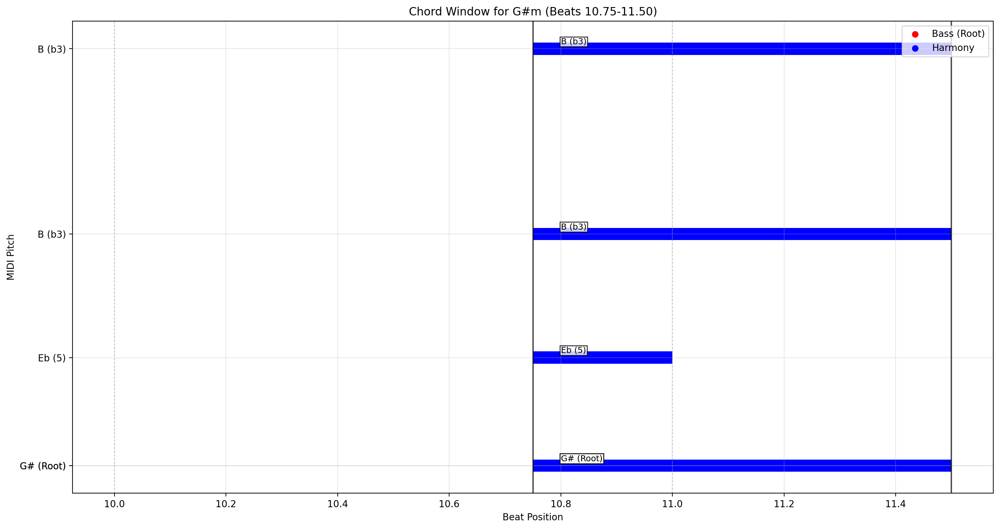


Bass note window 3: G# (10.75-11.50)
  Active harmony notes: ['Eb', 'B', 'B', 'G#']
  Significant intervals: [0, 3, 7]
  Identified chord: G#m


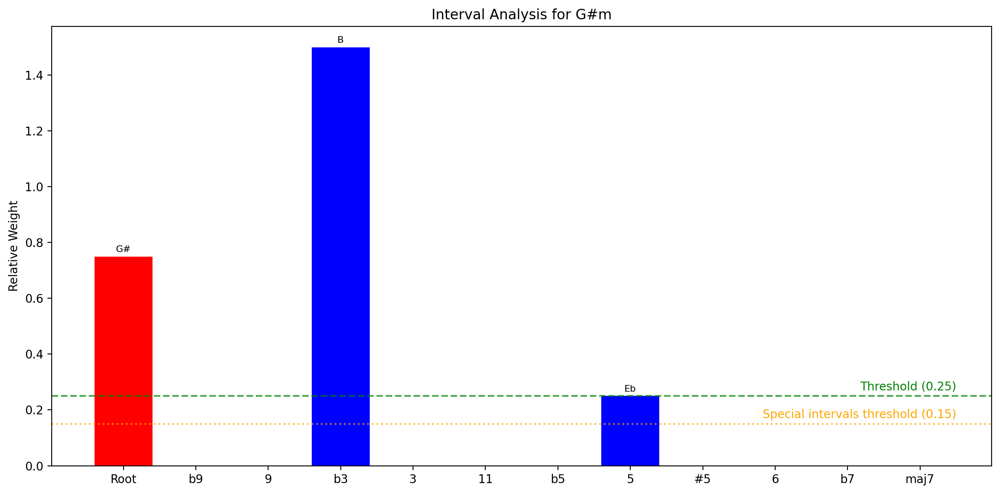


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
3        b3     1.500      1.500      B
0        Root   0.750      0.750      G#
7        5      0.250      0.250      Eb

=== Analyzing Bar 4 with Time Windows ===

Bass notes in bar 4:
  Total bass notes: 4
  Significant bass notes (duration >= 0.5): 1
  Bass 1: Eb (PC 3): 12.50-12.83, duration: 0.33


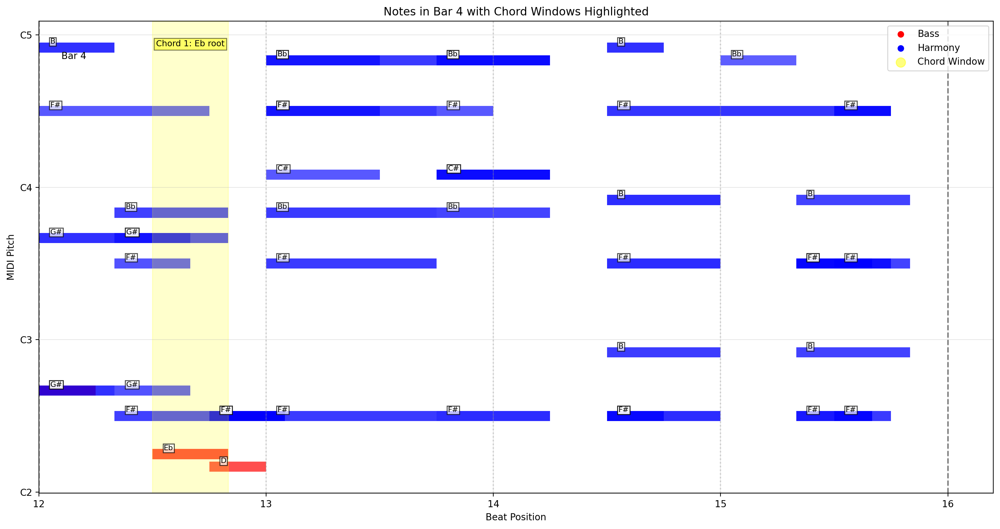

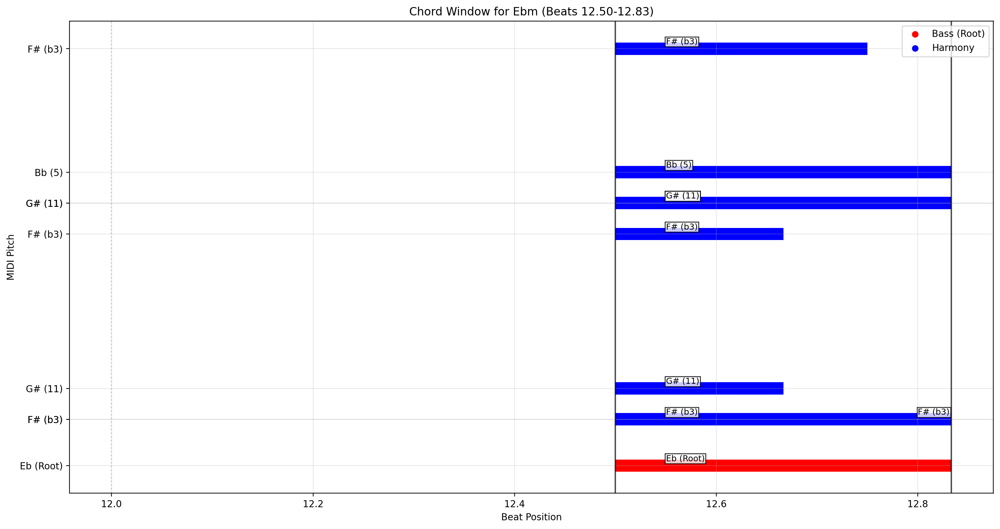


Bass note window 1: Eb (12.50-12.83)
  Active harmony notes: ['F#', 'F#', 'G#', 'G#', 'F#', 'G#', 'Bb', 'F#']
  Significant intervals: [0, 3, 5, 7]
  Identified chord: Ebm


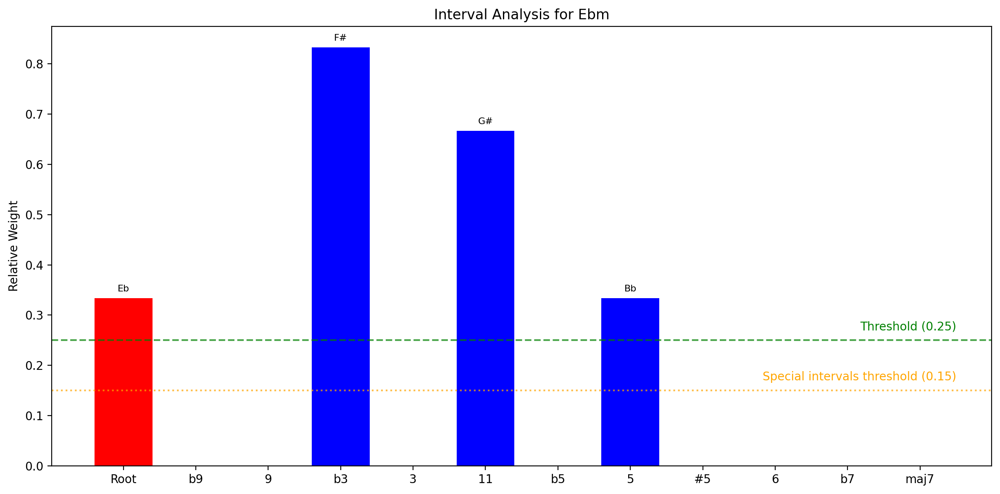


INTERVAL WEIGHTS:
Interval Name   Weight     Duration   Notes
----------------------------------------------------------------------
3        b3     0.833      0.833      F#
5        11     0.667      0.667      G#
0        Root   0.333      0.333      Eb
7        5      0.333      0.333      Bb

CHORD PROGRESSION SUMMARY (TIME-WINDOWED):
Bar    Chords
------------------------------------------------------------
1      C#7no3 → C#7 → C#7no3
2      C#m7
3      E → G#m7 → G#m
4      Ebm

=== Refined Chord Identification ===

Root: C#
Original Chord: C#7no3
Refined Chord: C#7
Normalized Interval Weights:
  b7: 0.375
  5: 0.375
  Root: 0.250

Root: C#
Original Chord: C#7
Refined Chord: C#7
Normalized Interval Weights:
  Root: 0.346
  b7: 0.308
  5: 0.192
  3: 0.154

Root: C#
Original Chord: C#7no3
Refined Chord: C#7
Normalized Interval Weights:
  b7: 0.444
  Root: 0.333
  5: 0.222

=== Refined Chord Identification ===

Root: C#
Original Chord: C#m7
Refined Chord: C#m7
Normalized Interval 

In [12]:
from chordAnalyzer import *

# Load notes from the MIDI files
bass_notes = load_midi_notes(bass_midi_path, source_name='bass')
harmony_notes = load_midi_notes(harmony_midi_path, source_name='harmony')

# Combine the notes
combined_notes = bass_notes + harmony_notes
combined_notes.sort(key=lambda x: x['start'])

print(f"Combined {len(bass_notes)} bass notes and {len(harmony_notes)} harmony notes")

# Optional: Add to the end of your existing script
refined_progression = analyze_progression_with_unique_chords(combined_notes, start_bar=0, num_bars=4)

# Cell 9: Analyze the first 4 bars with time-window approach
# print("\n=== Analyzing First 4 Bars with Time Windows ===")
# first_4_bars = analyze_progression_with_time_windows(combined_notes, start_bar=0, num_bars=4)
